## DS4420 Final Project - Dimensionality Reduction of Airbnb Data with PCA and t-SNE

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import time
import plotly.express as px


pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_rows', 999)

# Reading in Data

In [2]:
import os
import glob

def csv_to_df(filenames=[]):

    #if filenames param is empty, use all csv files in project_data folder
    if(len(filenames) == 0):
        filenames = [i for i in glob.glob('project_data/*.csv')]
        
    list_of_dfs = []
    
    for f in filenames:
        df = pd.read_csv(f)
        city_name = f[13:-4].replace('_', ' ')
        df["city"] = city_name.title()
        list_of_dfs.append(df)
        
    df = pd.concat(list_of_dfs)
    return df

In [3]:
df = csv_to_df([
    'project_data/san_francisco.csv', 
    'project_data/chicago.csv',
    #'project_data/seattle.csv',
    #'project_data/washington_dc.csv'
])

#city to number encodings for plotting
cities = df["city"].unique()
cities

array(['San Francisco', 'Chicago'], dtype=object)

# Data Preparation

In [4]:
df = df[["city",
             "last_scraped",
             "host_since", 
             "host_acceptance_rate",
             "host_listings_count", 
             "accommodates", 
             "bedrooms", 
             "beds", 
             "bathrooms_text", 
             "price", 
             "minimum_nights", 
             "availability_90", 
             "number_of_reviews", 
             "first_review",
             "last_review",
             "review_scores_rating",
             "reviews_per_month"]]

In [5]:
df["city"].value_counts()

San Francisco    6931
Chicago          6372
Name: city, dtype: int64

In [6]:
df.isna().sum().to_frame().sort_values(0, ascending=False)/df.shape[0]

,0
review_scores_rating,0.222882
reviews_per_month,0.216267
last_review,0.216267
first_review,0.216267
host_acceptance_rate,0.166654
bedrooms,0.102909
beds,0.006465
bathrooms_text,0.000827
host_listings_count,0.000301
host_since,0.000301


In [7]:
df = df.dropna()
df["city"].value_counts()

Chicago          4202
San Francisco    3849
Name: city, dtype: int64

In [8]:
df.dtypes

city                     object
last_scraped             object
host_since               object
host_acceptance_rate     object
host_listings_count     float64
accommodates              int64
bedrooms                float64
beds                    float64
bathrooms_text           object
price                    object
minimum_nights            int64
availability_90           int64
number_of_reviews         int64
first_review             object
last_review              object
review_scores_rating    float64
reviews_per_month       float64
dtype: object

In [9]:
df["price"] = df["price"].replace({'\$':'', ',':''}, regex=True).astype('float')
df["host_acceptance_rate"] = df["host_acceptance_rate"].replace({'%':''}, regex=True).astype('float')/100

In [10]:
df["last_scraped"] = pd.to_datetime(df["last_scraped"])
df["host_since"] = pd.to_datetime(df["host_since"])
df["first_review"] = pd.to_datetime(df["first_review"])
df["last_review"] = pd.to_datetime(df["last_review"])
df["days_hosting"] = (df["last_scraped"] - df["host_since"]).dt.days
df["days_since_first_review"] = (df["last_scraped"] - df["first_review"]).dt.days
df["days_since_last_review"] = (df["last_scraped"] - df["last_review"]).dt.days
df.drop(columns=["last_scraped", "host_since", "first_review", "last_review"], inplace=True)

In [11]:
df["bathrooms"] = df.bathrooms_text.replace({"half":"0.5", "Half":"0.5"}, regex=True).replace("[a-zA-Z-\s]", "", regex=True).astype(float)
df.drop(columns=["bathrooms_text"], inplace=True)

# Data Exploration

In [12]:
for city in cities:
    print(city)
    display(df[df["city"] == city].describe().transpose()[["mean", "std", "min", "50%", "max"]])

San Francisco


,mean,std,min,50%,max
host_acceptance_rate,0.877659,0.215601,0.00,0.98,1.00
host_listings_count,32.702780,177.194695,0.00,2.00,2739.00
accommodates,3.231749,1.952881,1.00,2.00,16.00
bedrooms,1.488958,0.834511,1.00,1.00,8.00
beds,1.832164,1.278681,0.00,1.00,14.00
price,195.081060,257.505738,20.00,137.00,9999.00
minimum_nights,14.037932,24.317516,1.00,3.00,1125.00
availability_90,44.526890,37.325963,0.00,50.00,90.00
number_of_reviews,66.584308,98.414033,1.00,24.00,821.00
review_scores_rating,95.399065,7.851451,20.00,98.00,100.00


Chicago


,mean,std,min,50%,max
host_acceptance_rate,0.864893,0.207382,0.00,0.95,1.00
host_listings_count,19.297953,117.967242,0.00,2.00,1386.00
accommodates,4.503094,3.029666,1.00,4.00,16.00
bedrooms,1.813660,1.087802,1.00,1.00,12.00
beds,2.303427,1.751806,0.00,2.00,17.00
price,132.827701,343.273987,10.00,86.00,9999.00
minimum_nights,5.696573,14.686197,1.00,2.00,365.00
availability_90,52.143741,35.987114,0.00,65.00,90.00
number_of_reviews,55.794622,74.340025,1.00,27.00,658.00
review_scores_rating,94.995002,7.718952,20.00,97.00,100.00


# Data Normalization

In [13]:
from sklearn import preprocessing
mm_scaler = preprocessing.MinMaxScaler()
s_scaler = preprocessing.StandardScaler()

data = df[df.price < df.price.quantile(0.99)].sample(2000)

#city to int encodings for 3d plot
city = data["city"]
city_colors = data["city"].replace({k:v for v,k in enumerate(data["city"].unique())})

#drop categorical column before normalizing
data.drop("city", axis=1, inplace=True)

data_scaled = pd.DataFrame(mm_scaler.fit_transform(data), index=data.index, columns=data.columns)
data_standardized = pd.DataFrame(s_scaler.fit_transform(data), index=data.index, columns=data.columns)

In [16]:
data_scaled.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
host_acceptance_rate,2000.0,0.870605,0.212847,0.0,0.830000,0.970000,1.000000,1.0
host_listings_count,2000.0,0.008369,0.051944,0.0,0.000365,0.000730,0.002191,1.0
accommodates,2000.0,0.192633,0.174811,0.0,0.066667,0.133333,0.266667,1.0
bedrooms,2000.0,0.080750,0.118594,0.0,0.000000,0.000000,0.125000,1.0
beds,2000.0,0.187136,0.131901,0.0,0.090909,0.181818,0.272727,1.0
price,2000.0,0.130595,0.130301,0.0,0.051935,0.089613,0.158859,1.0
minimum_nights,2000.0,0.023220,0.047322,0.0,0.000000,0.002747,0.024725,1.0
availability_90,2000.0,0.539872,0.407067,0.0,0.011111,0.627778,0.966667,1.0
number_of_reviews,2000.0,0.094026,0.136466,0.0,0.007474,0.037369,0.125934,1.0
review_scores_rating,2000.0,0.937025,0.105233,0.0,0.925000,0.962500,1.000000,1.0


In [17]:
data_standardized.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
host_acceptance_rate,2000.0,-3.517187e-16,1.00025,-4.091300,-0.190818,0.467094,0.608076,0.608076
host_listings_count,2000.0,-3.552714e-18,1.00025,-0.161154,-0.154124,-0.147093,-0.118972,19.095073
accommodates,2000.0,-4.440892e-18,1.00025,-1.102229,-0.720769,-0.339309,0.423612,4.619674
bedrooms,2000.0,1.492140e-16,1.00025,-0.681063,-0.681063,-0.681063,0.373214,7.753158
beds,2000.0,2.842171e-17,1.00025,-1.419123,-0.729726,-0.040330,0.649067,6.164239
price,2000.0,-1.865175e-17,1.00025,-1.002508,-0.603831,-0.314595,0.216974,6.673975
minimum_nights,2000.0,3.019807e-17,1.00025,-0.490795,-0.490795,-0.432726,0.031822,20.646123
availability_90,2000.0,-7.993606e-17,1.00025,-1.326580,-1.299278,0.216002,1.048724,1.130631
number_of_reviews,2000.0,-2.486900e-17,1.00025,-0.689183,-0.634402,-0.415278,0.233876,6.640509
review_scores_rating,2000.0,-4.014566e-16,1.00025,-8.906547,-0.114299,0.242143,0.598586,0.598586


# Plotting Functions

In [14]:
def pca_2d_plot(model, colors):
    pc_1 = model[:,0]
    pc_2 = model[:,1]
    pc_3 = model[:,2]


    plt.figure(figsize=(10,6))
    sns.scatterplot(
        x=pc_1, y=pc_2,
        legend="auto",
        hue=colors,
        alpha=0.3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, title=colors.name)

    plt.show()

In [15]:
def pca_3d_plot(model, colors):
    pc_1 = model[:,0]
    pc_2 = model[:,1]
    pc_3 = model[:,2]
    
    ax = plt.figure(figsize=(15,10)).gca(projection='3d')
    ax.scatter(
        xs=pc_1, 
        ys=pc_2, 
        zs=pc_3, 
        c=colors, 
        cmap='winter'

    )
    ax.set_xlabel('pca-one')
    ax.set_ylabel('pca-two')
    ax.set_zlabel('pca-three')
    plt.show()
    
    
def pca_3d_plot_interactive(model, colors):
    pc_1 = model[:,0]
    pc_2 = model[:,1]
    pc_3 = model[:,2]
    fig = px.scatter_3d(x=pc_1, 
                            y=pc_2, 
                            z=pc_3, 
                            color=colors, 
                            opacity=0.9, 
                            labels={'PC One': 'X', 'PC Two': 'Y', 'PC Three':'Z'})

    fig.write_html('scatter-3d.html')
    fig.show()

In [16]:
def tsne_plot(model, colors):
    tsne_1 = model[:,0]
    tsne_2 = model[:,1]
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        x=tsne_1, 
        y=tsne_2,
        legend="auto",
        hue=colors,
        alpha=0.3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, title=colors.name)
    plt.show()

In [17]:
from matplotlib import colors

#Credit here for this function:
#https://stackoverflow.com/questions/56202218/pandas-styling-conditionally-change-background-color-of-column-by-absolute-valu

def highlight_gradient(s):
    cm=sns.light_palette("green", as_cmap=True)
    max_val = max(s.max(), abs(s.min()))
    norm = colors.Normalize(0,max_val)
    normed = norm(abs(s.values))
    c = [colors.rgb2hex(x) for x in plt.cm.get_cmap(cm)(normed)]
    return ['background-color: ' + color for color in c]

# Modelling and Plotting Unscaled Data

In [18]:
pca_unscaled = PCA(n_components=3)
pca_model_unscaled = pca_unscaled.fit_transform(data)
print('PC One Variation: {}'.format(pca_unscaled.explained_variance_ratio_[0]))
print('PC Two Variation: {}'.format(pca_unscaled.explained_variance_ratio_[1]))
print('PC Three Variation: {}'.format(pca_unscaled.explained_variance_ratio_[2]))
df = pd.DataFrame(pca_unscaled.components_, columns=data.columns, index=["PC One", "PC Two", "PC Three"]).transpose()

df.style.apply(highlight_gradient)

PC One Variation: 0.711572844499039
PC Two Variation: 0.21380983351528865
PC Three Variation: 0.049653222176018745


,PC One,PC Two,PC Three
host_acceptance_rate,-0.000030,0.000017,-0.000169
host_listings_count,-0.009567,0.017095,0.046791
accommodates,-0.000354,0.000034,-0.000531
bedrooms,-0.000071,0.000034,-0.000032
beds,-0.000131,-0.000010,-0.000226
price,0.010243,-0.002628,0.067411
minimum_nights,0.002172,0.002349,0.012719
availability_90,-0.002651,-0.004383,-0.001117
number_of_reviews,0.027990,-0.052390,-0.111357
review_scores_rating,0.000598,0.000617,-0.001940


Unsurpisingly, the columns with large values (days_hosting and days_since_first_review) seem to control most of the variance. We need to scale the columns.

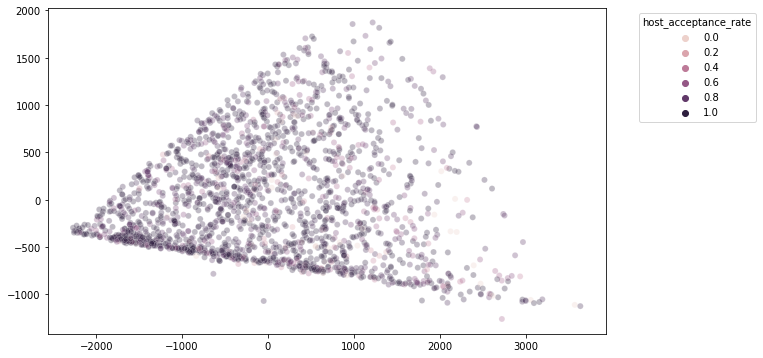

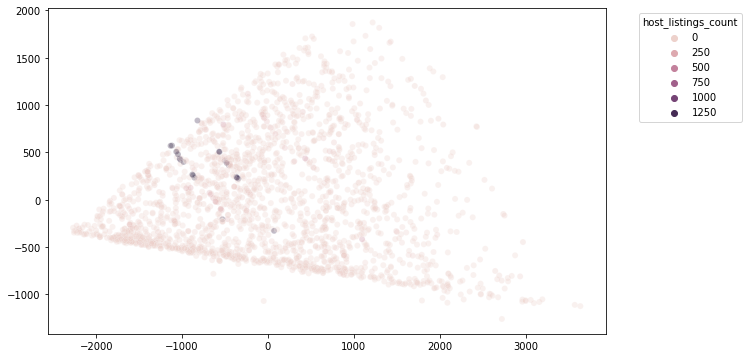

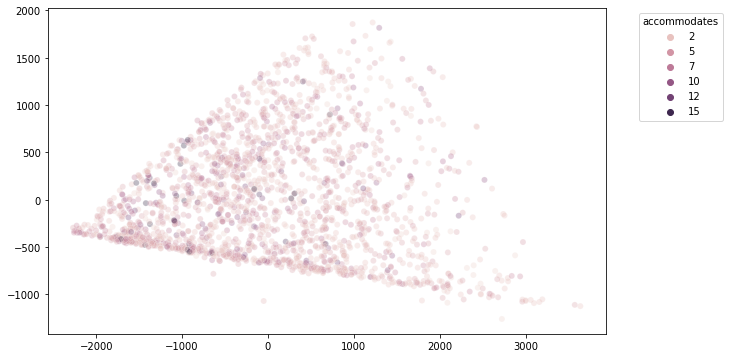

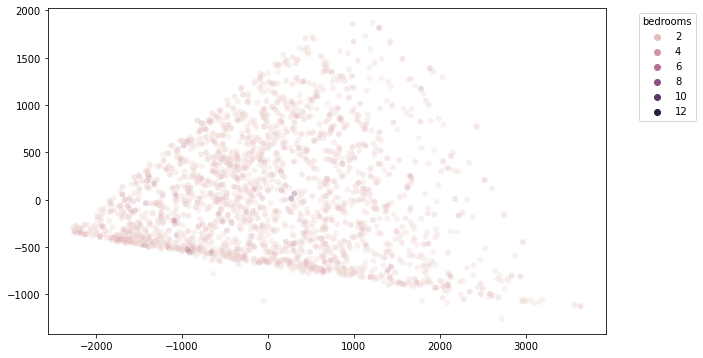

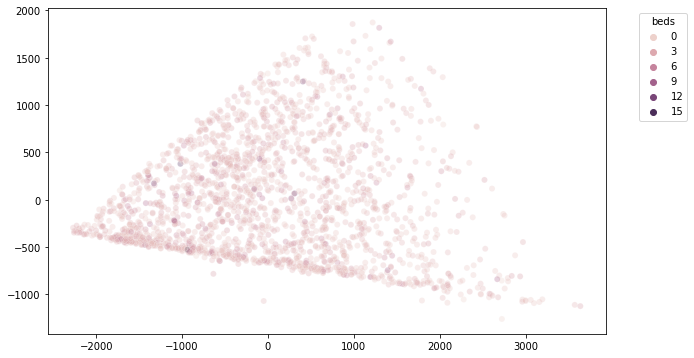

...

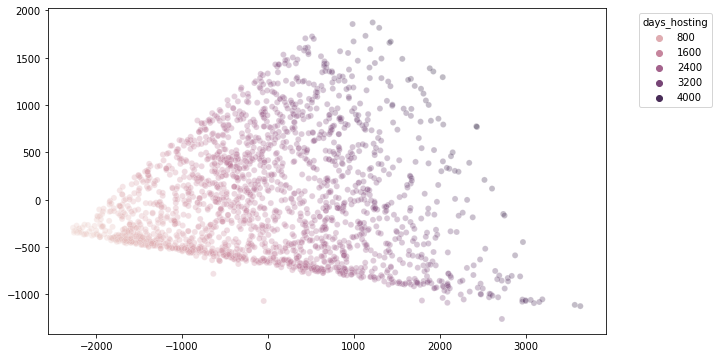

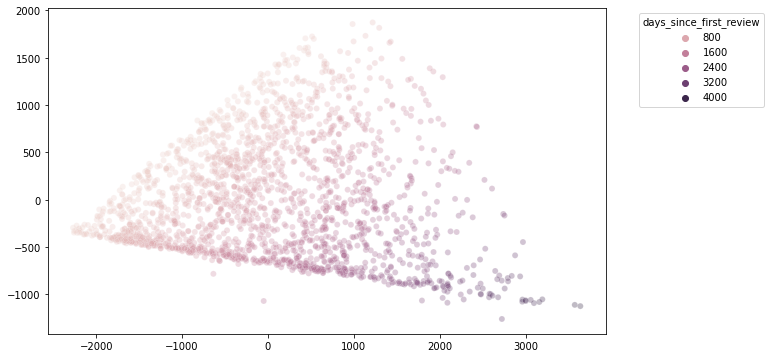

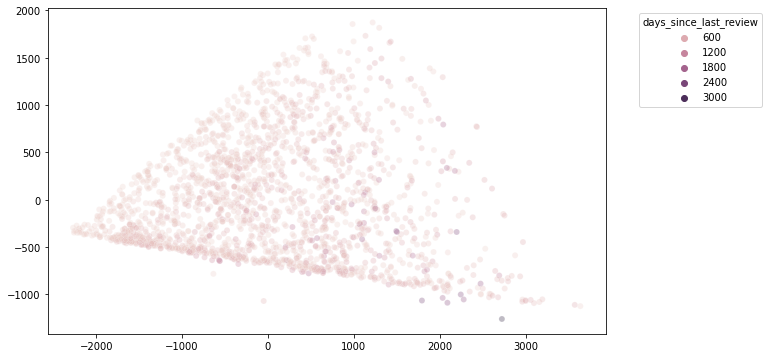

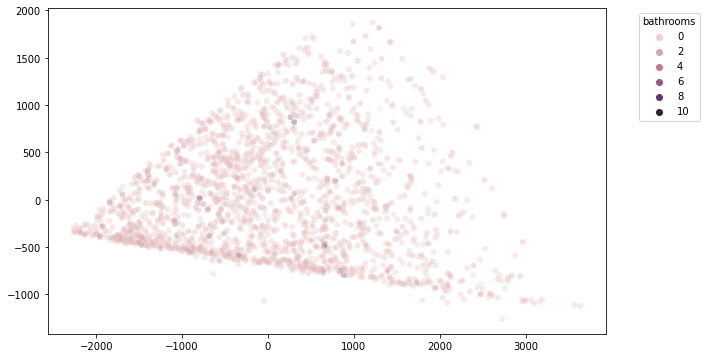

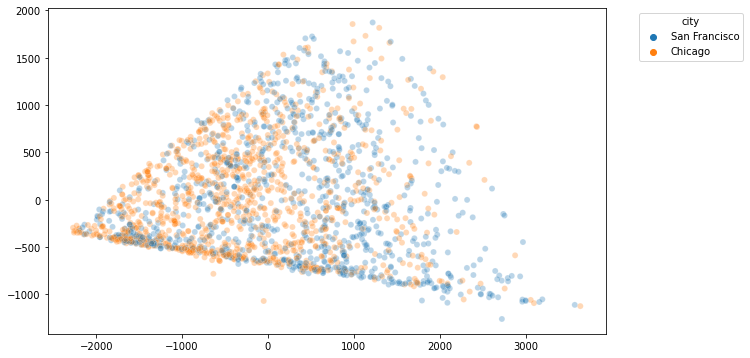

In [19]:
for col in data.columns:
    pca_2d_plot(pca_model_unscaled, data[col])
pca_2d_plot(pca_model_unscaled, city)
#pca_3d_plot_interactive(pca_model, city)

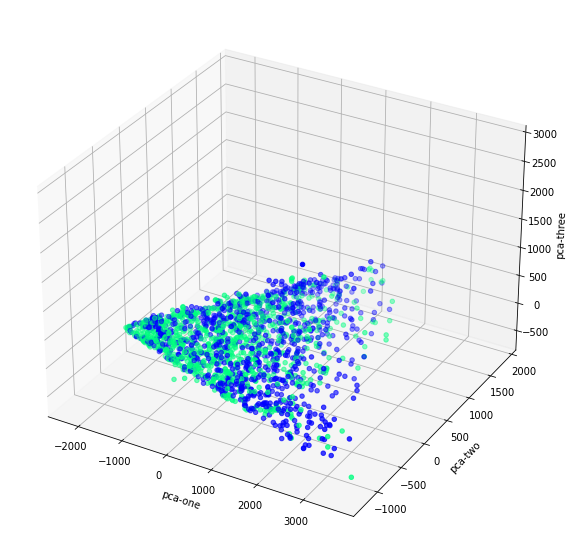

In [20]:
pca_3d_plot(pca_model_unscaled, city_colors)

In [21]:
tsne_unscaled = TSNE(n_components=2, perplexity=50, n_iter=2000)
tsne_model_unscaled = tsne_unscaled.fit_transform(data)

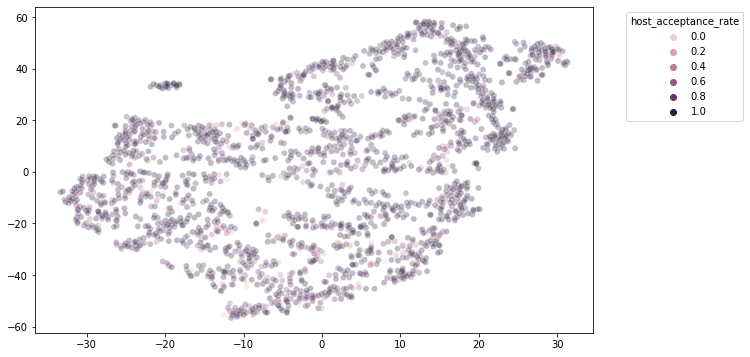

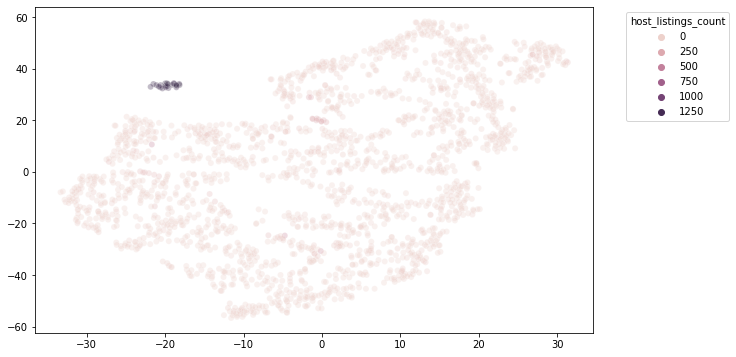

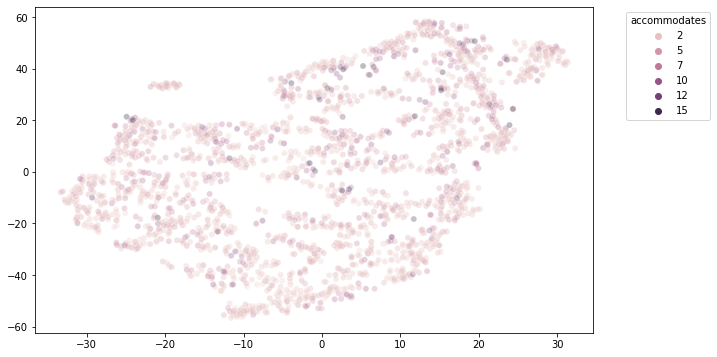

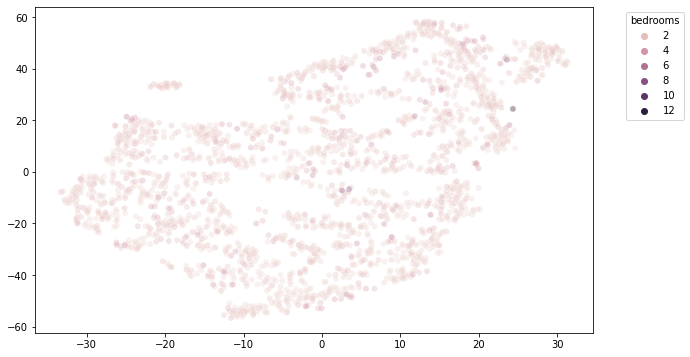

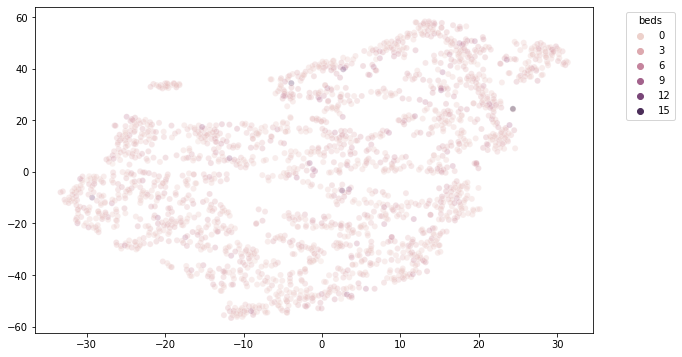

...

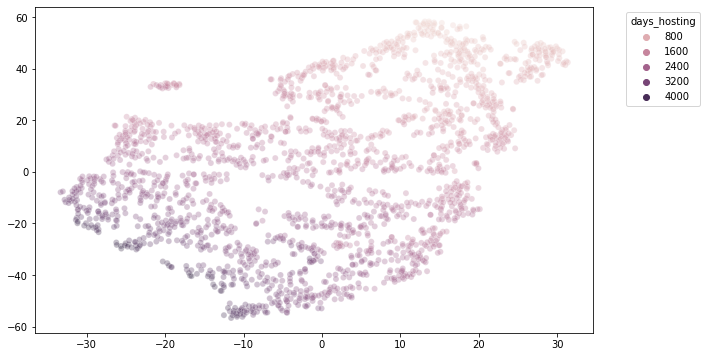

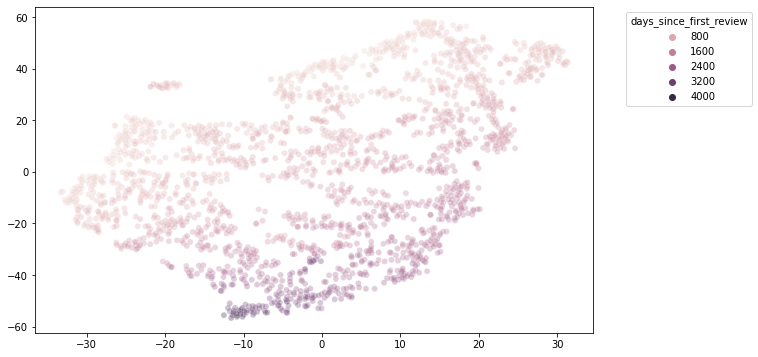

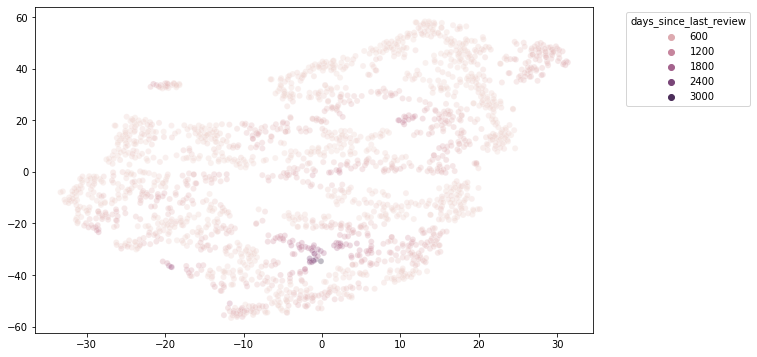

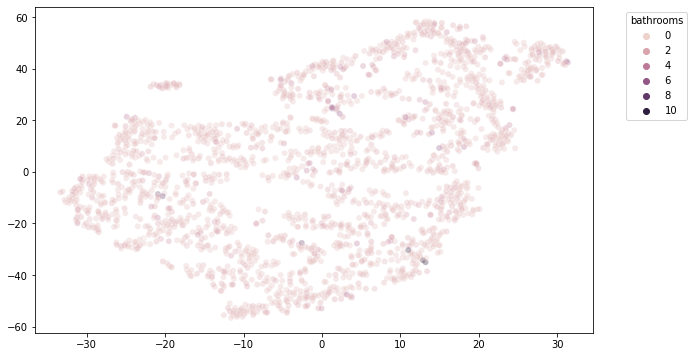

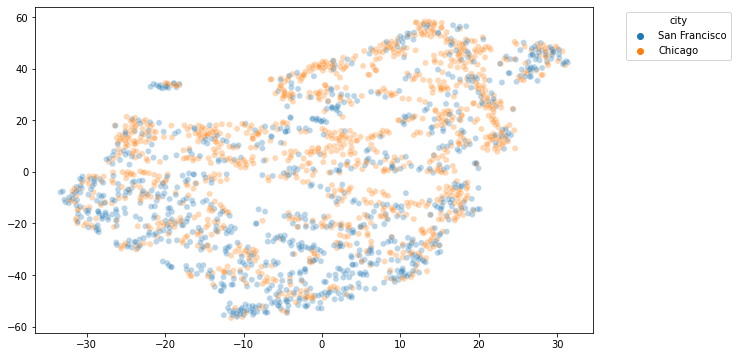

In [22]:
for col in data.columns:
    tsne_plot(tsne_model_unscaled, data[col])
tsne_plot(tsne_model_unscaled, city)

# Modelling and Plotting Scaled Data

In [23]:
pca_scaled = PCA(n_components=3)
pca_model_scaled = pca_scaled.fit_transform(data_scaled.values)
print('PC One Variation: {}'.format(pca_scaled.explained_variance_ratio_[0]))
print('PC Two Variation: {}'.format(pca_scaled.explained_variance_ratio_[1]))
print('PC Three Variation: {}'.format(pca_scaled.explained_variance_ratio_[2]))
df = pd.DataFrame(pca_scaled.components_, columns=data_scaled.columns, index=["PC One", "PC Two", "PC Three"]).transpose()
df.style.apply(highlight_gradient)

PC One Variation: 0.40641203859752567
PC Two Variation: 0.16893289799948835
PC Three Variation: 0.11937662251811947


,PC One,PC Two,PC Three
host_acceptance_rate,0.029190,-0.282566,-0.404688
host_listings_count,-0.001003,-0.035616,-0.014834
accommodates,-0.024045,-0.224594,0.656274
bedrooms,-0.005609,-0.088815,0.326343
beds,-0.010806,-0.090920,0.306344
price,0.010032,-0.015683,0.381809
minimum_nights,-0.003063,0.026448,0.001962
availability_90,-0.995613,0.067840,-0.017974
number_of_reviews,0.006242,0.171601,-0.089082
review_scores_rating,0.020375,0.026363,0.027069


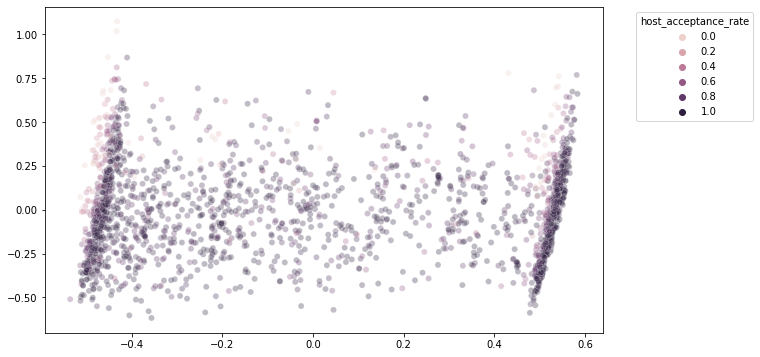

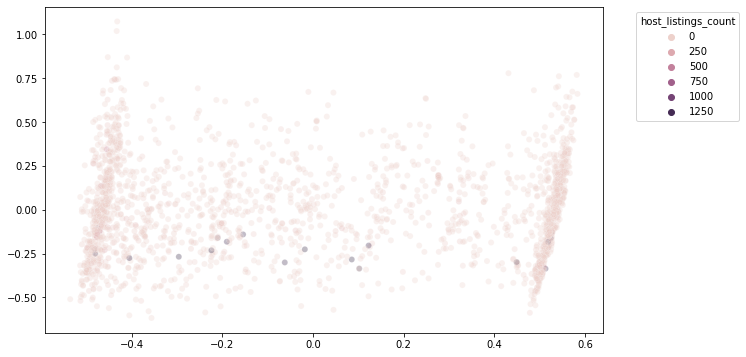

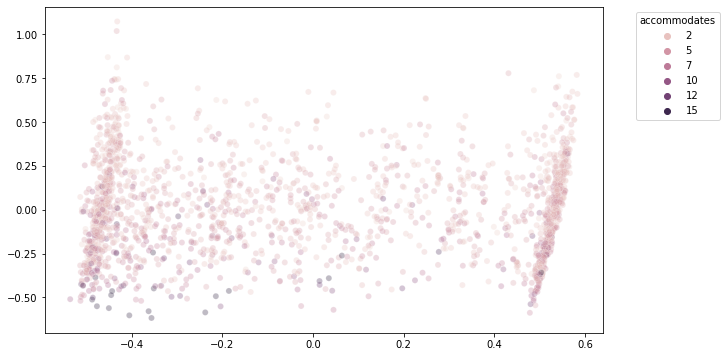

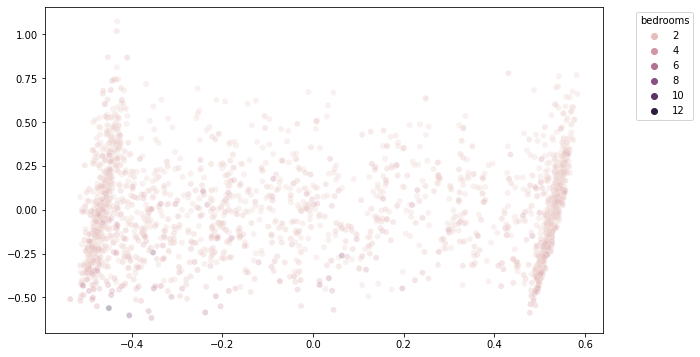

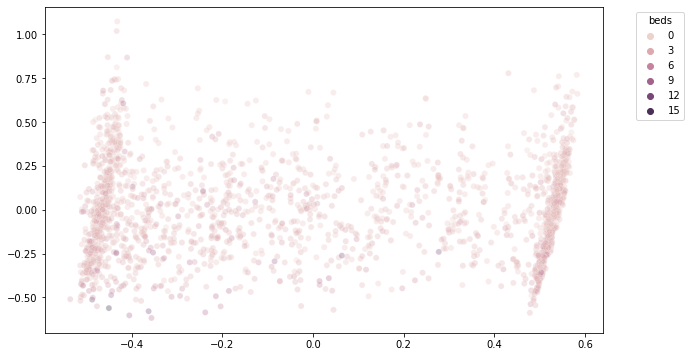

...

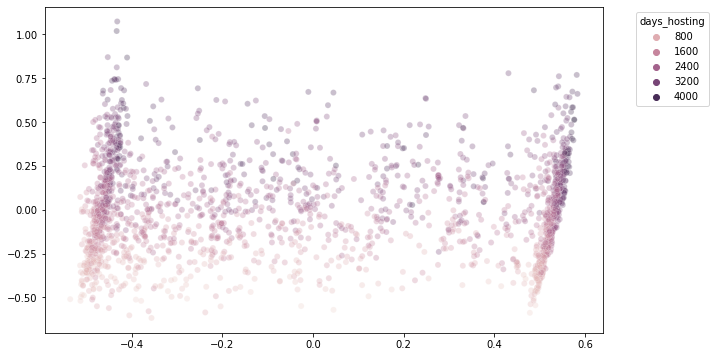

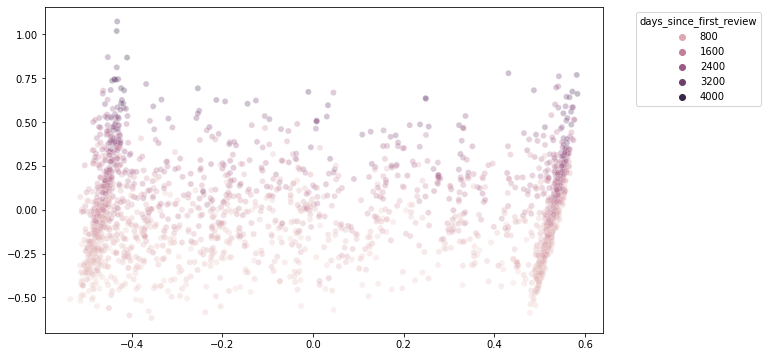

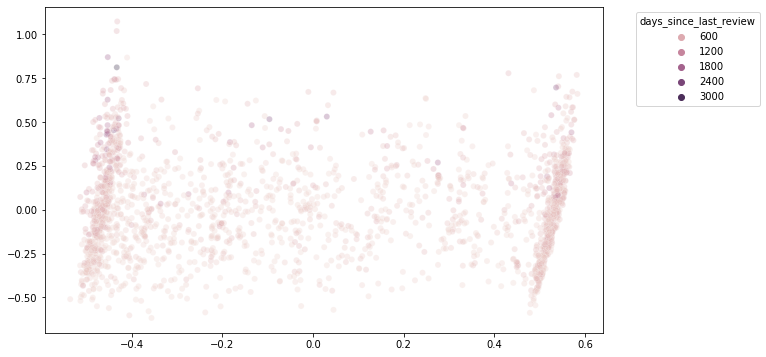

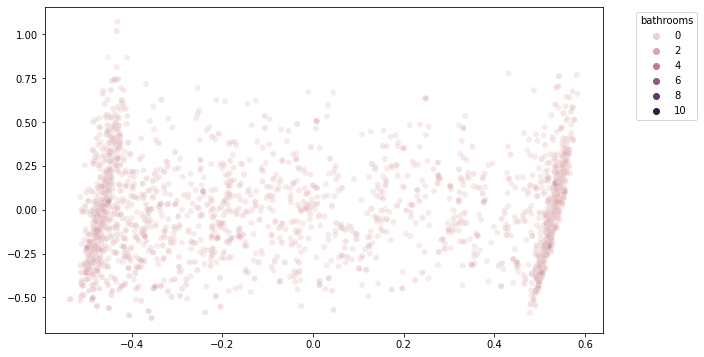

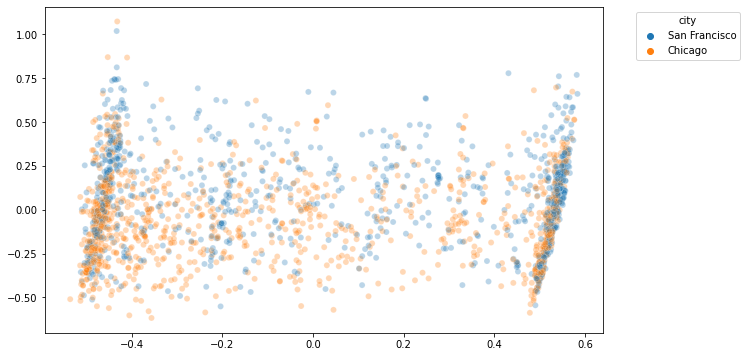

In [24]:
for col in data.columns:
    pca_2d_plot(pca_model_scaled, data[col])
pca_2d_plot(pca_model_scaled, city)

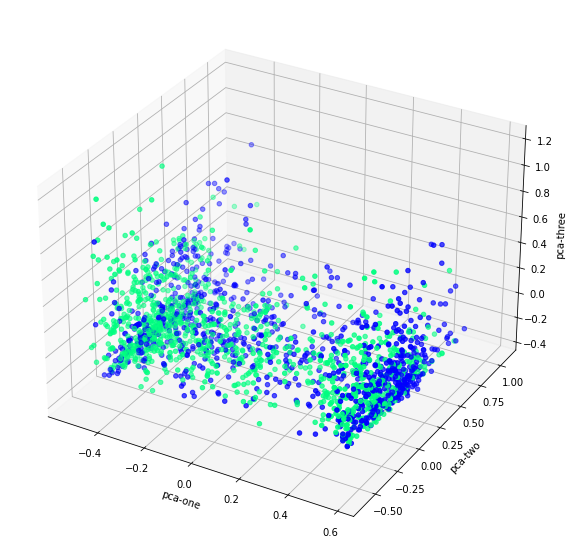

In [25]:
pca_3d_plot(pca_model_scaled, city_colors)
#pca_3d_plot_interactive(pca_model, city)

In [26]:
tsne_scaled = TSNE(n_components=2, perplexity=50, n_iter=2000)
tsne_model_scaled = tsne_scaled.fit_transform(data_scaled)

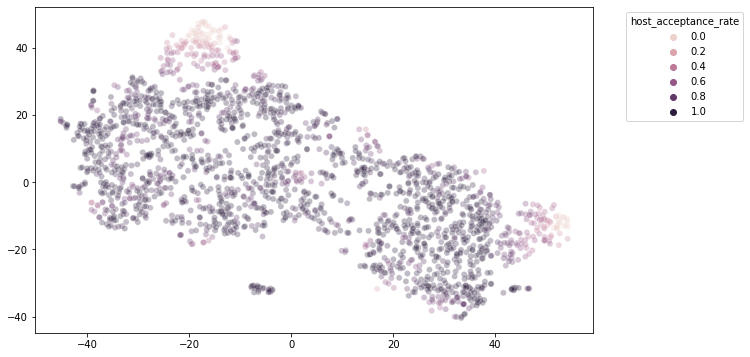

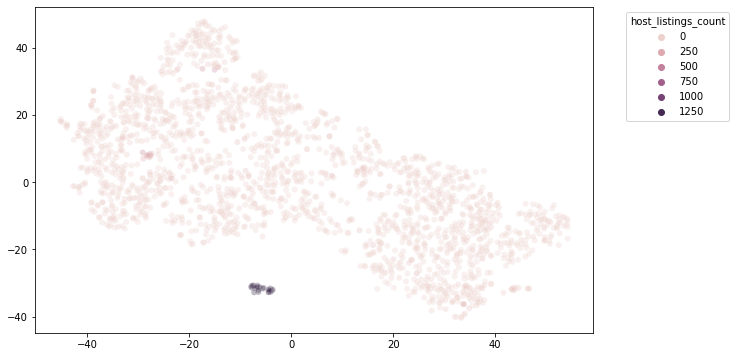

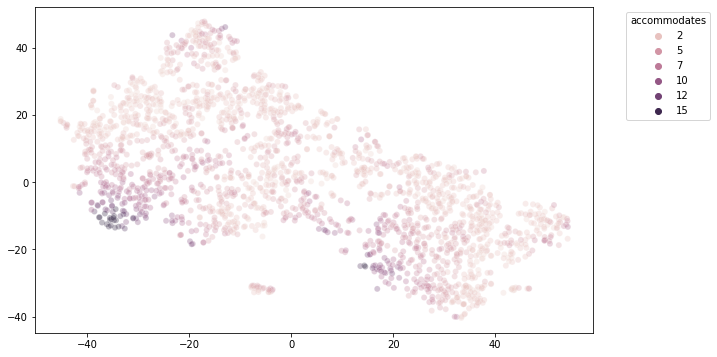

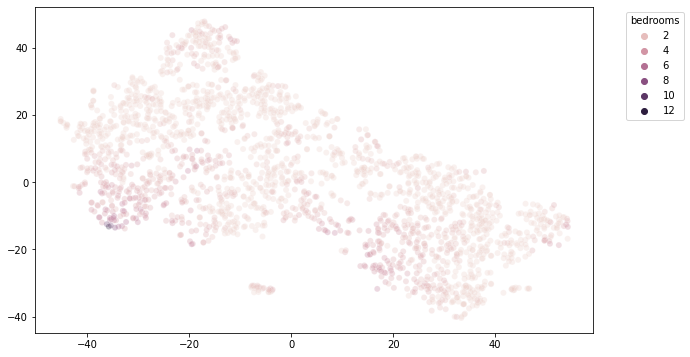

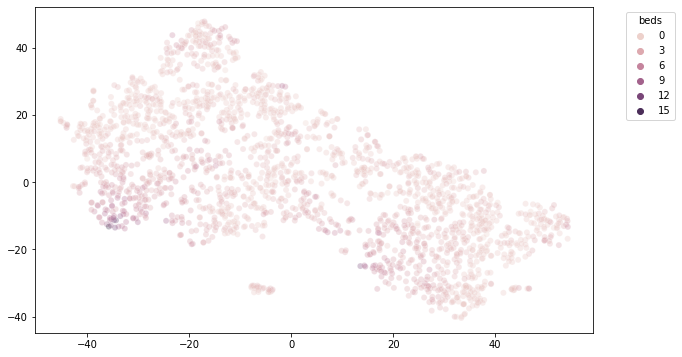

...

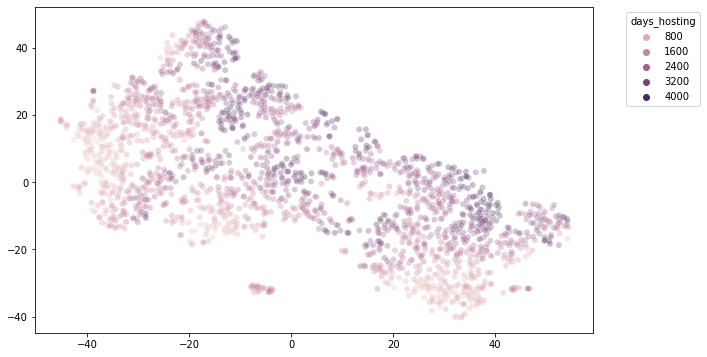

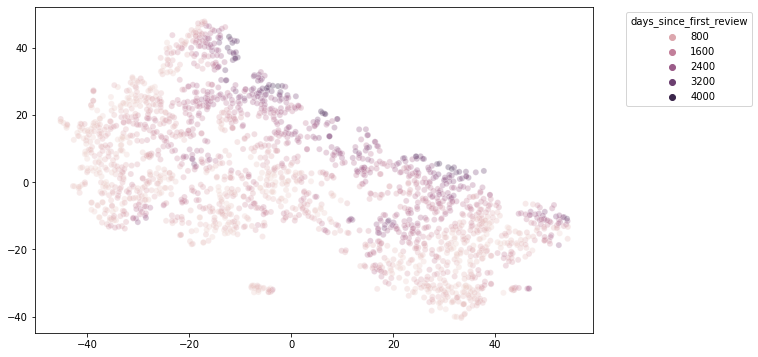

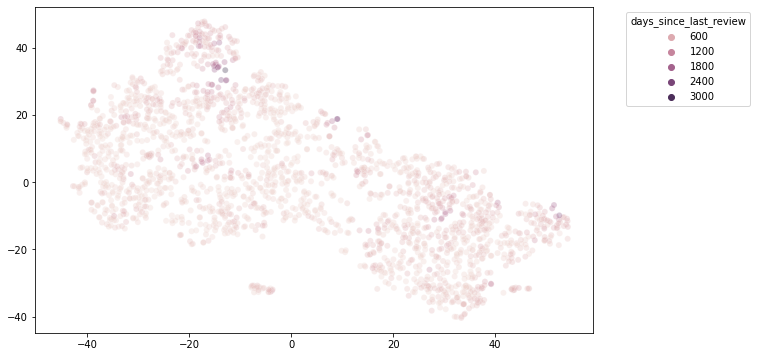

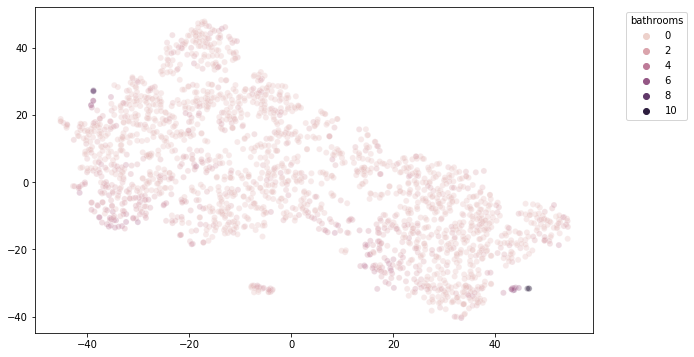

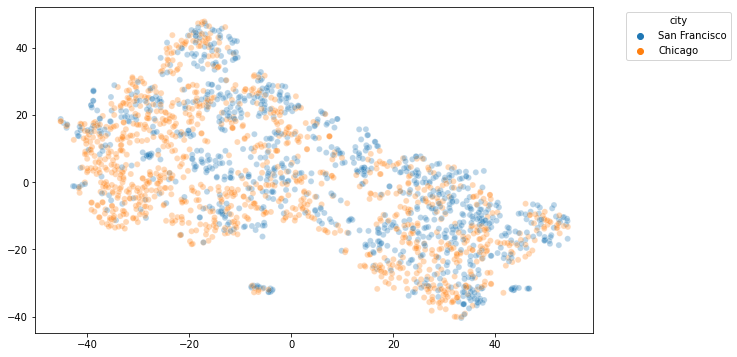

In [27]:
for col in data.columns:
    tsne_plot(tsne_model_scaled, data[col])
tsne_plot(tsne_model_scaled, city)

# Modelling and Plotting Standardized Data

In [28]:
pca_stand = PCA(n_components=3)
pca_model_stand = pca_stand.fit_transform(data_standardized.values)
print('PC One Variation: {}'.format(pca_stand.explained_variance_ratio_[0]))
print('PC Two Variation: {}'.format(pca_stand.explained_variance_ratio_[1]))
print('PC Three Variation: {}'.format(pca_stand.explained_variance_ratio_[2]))
df = pd.DataFrame(pca_stand.components_, columns=data_standardized.columns, index=["PC One", "PC Two", "PC Three"]).transpose()
df.style.apply(highlight_gradient)

PC One Variation: 0.22017784159608508
PC Two Variation: 0.14673336937527087
PC Three Variation: 0.13163164614424844


,PC One,PC Two,PC Three
host_acceptance_rate,-0.013776,-0.237471,-0.227279
host_listings_count,0.012899,0.145408,-0.109510
accommodates,0.494735,-0.133732,0.031512
bedrooms,0.498624,-0.065834,0.082399
beds,0.483548,-0.126212,0.068750
price,0.346612,0.092576,0.211929
minimum_nights,-0.029218,0.348082,0.109552
availability_90,0.014798,-0.008527,-0.072409
number_of_reviews,-0.155425,-0.504127,0.331375
review_scores_rating,0.020793,-0.059922,0.134994


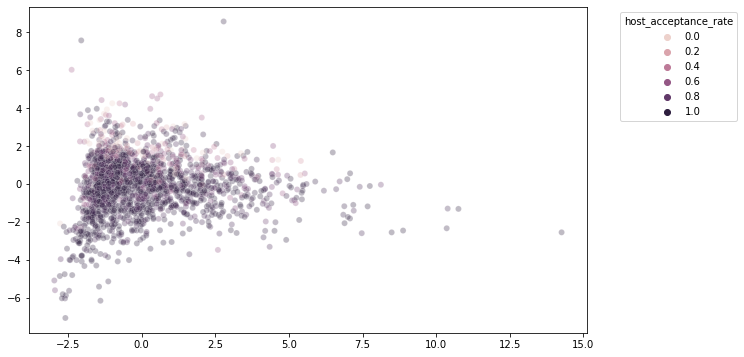

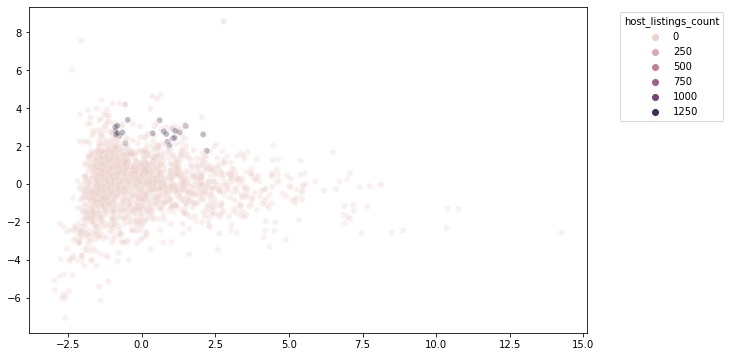

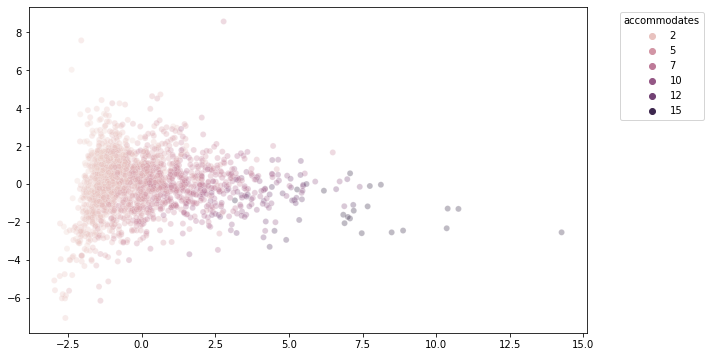

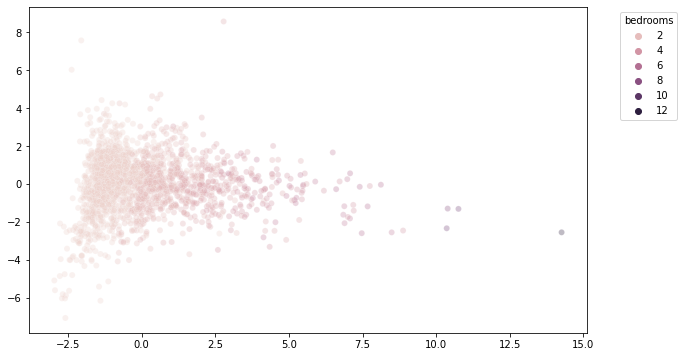

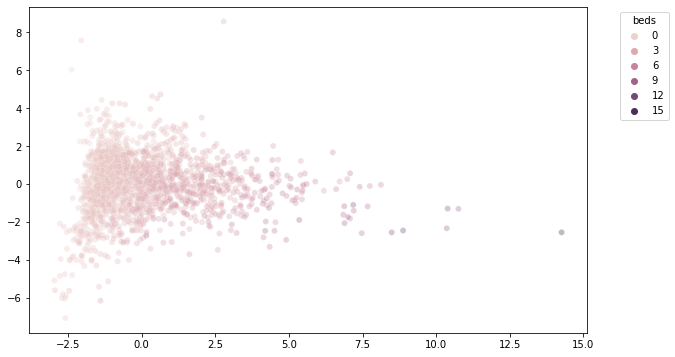

...

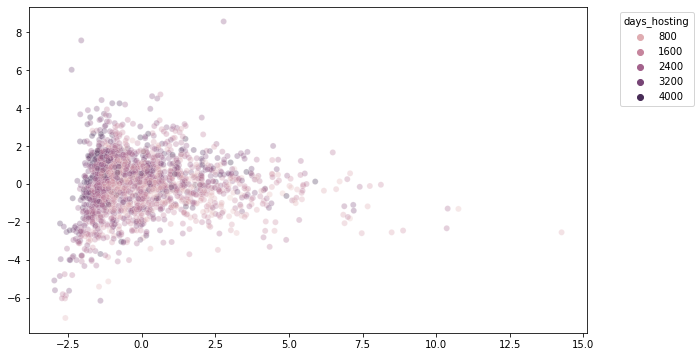

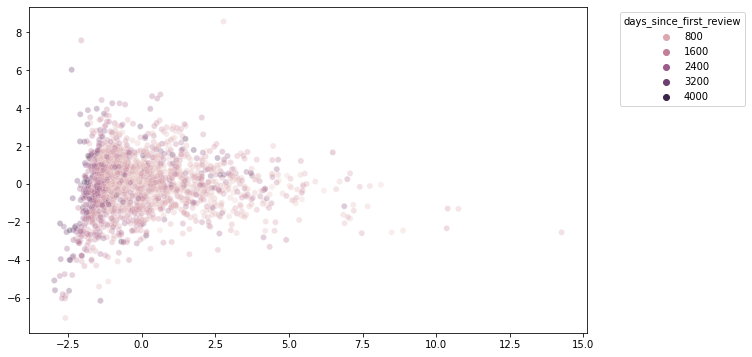

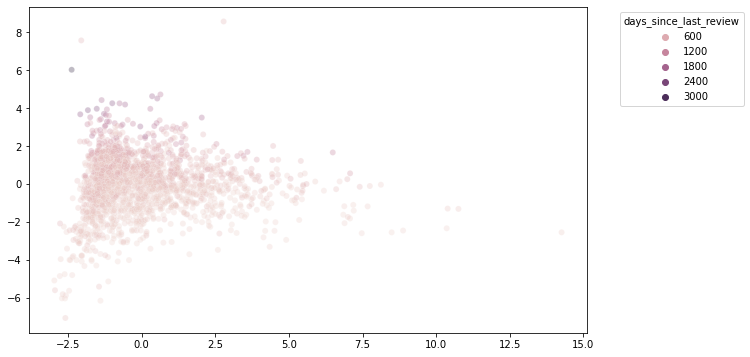

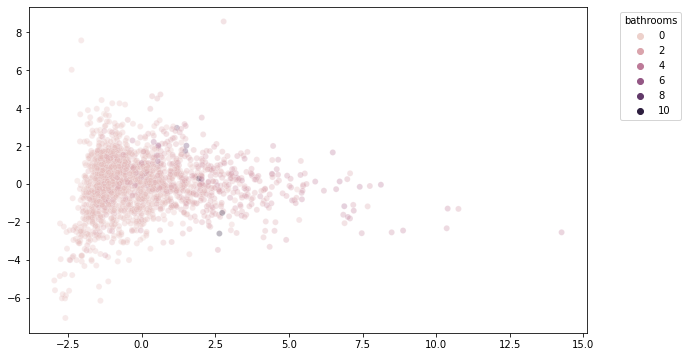

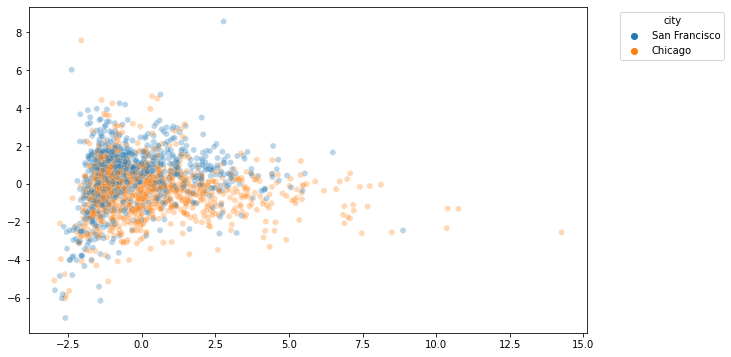

In [29]:
for col in data.columns:
    pca_2d_plot(pca_model_stand, data[col])
pca_2d_plot(pca_model_stand, city)

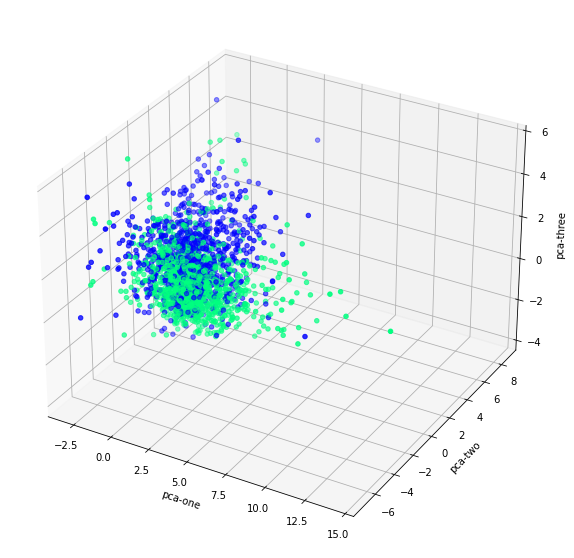

In [30]:
pca_3d_plot(pca_model_stand, city_colors)
#pca_3d_plot_interactive(pca_model, city)

In [31]:
tsne_stand = TSNE(n_components=3, perplexity=50, n_iter=2000)
tsne_model_stand = tsne_stand.fit_transform(data_standardized)

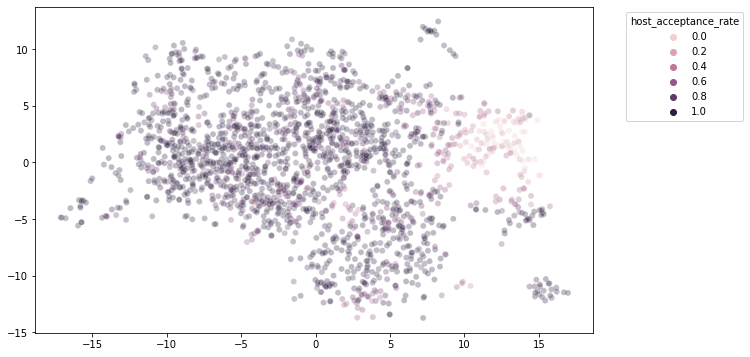

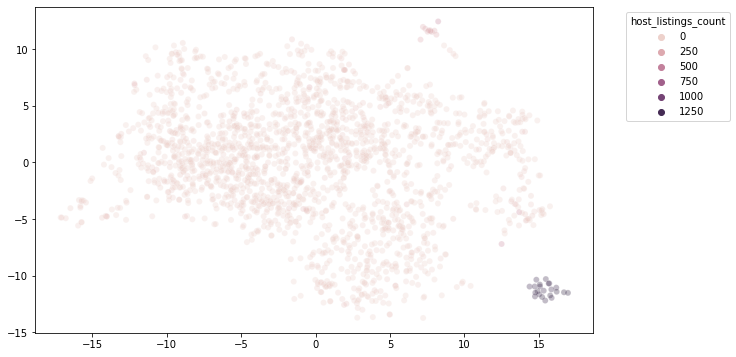

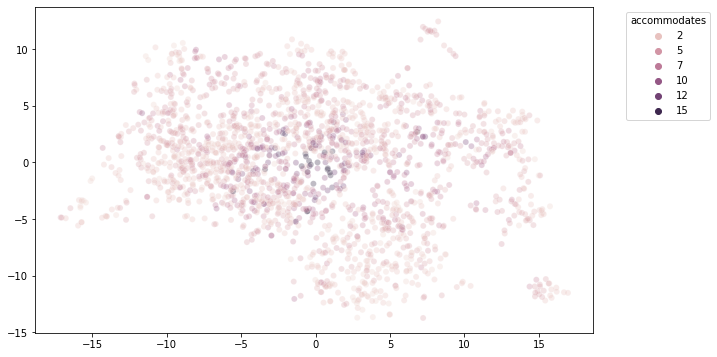

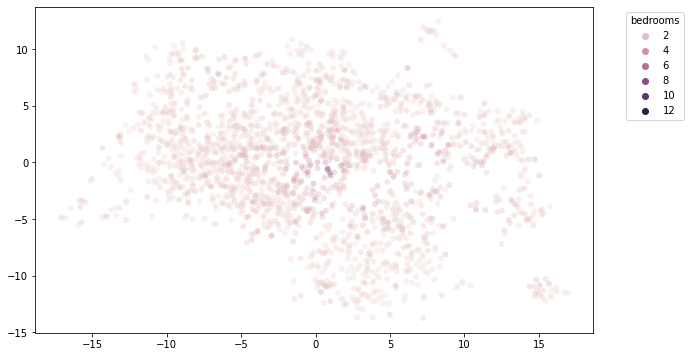

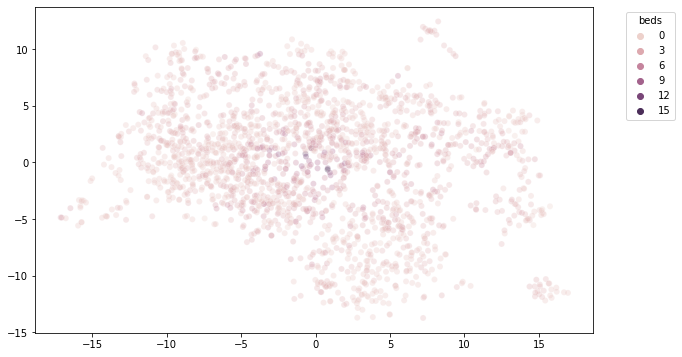

...

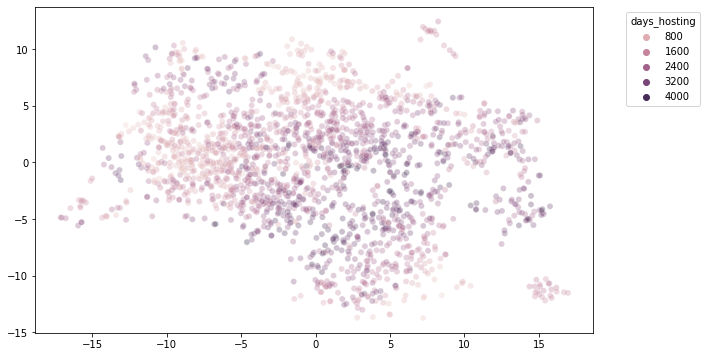

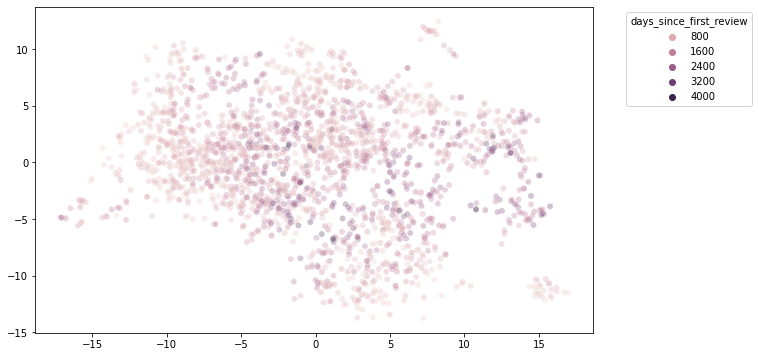

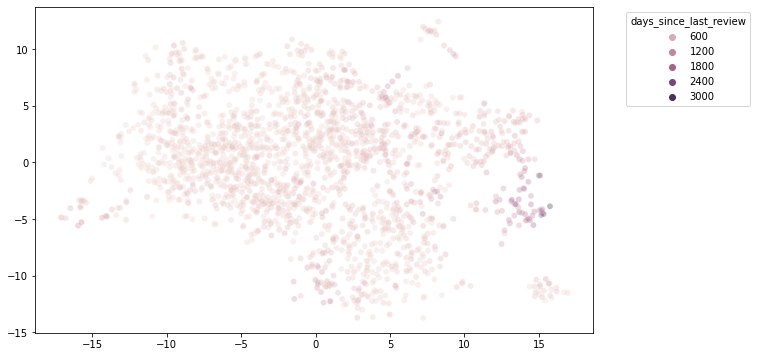

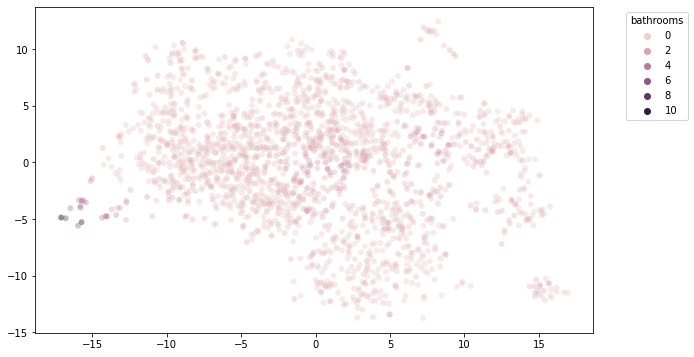

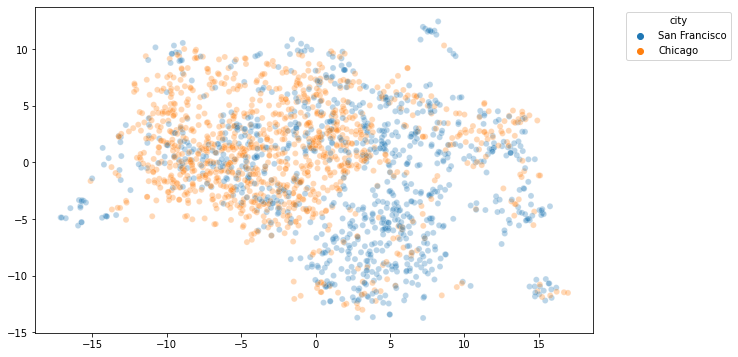

In [32]:
for col in data.columns:
    tsne_plot(tsne_model_stand, data[col])
tsne_plot(tsne_model_stand, city)